In [1]:
from collections import defaultdict
import seaborn as sns
import matplotlib.pyplot as plt

from extract_latest_data import *
from util import *

### Plot sidewalk coverage of entire city

Load data

In [2]:
city = 'sea'
l = LatestHandler()
l.read_parsed_data(city)

sidewalk = l.filter_data(sidewalk_qualifier)
sidewalk = l.get_gdf(sidewalk)

w_sidewalk = l.filter_data(highway_with_sidewalk)
w_sidewalk = l.get_gdf(w_sidewalk)

wo_sidewalk = l.filter_data(highway_without_sidewalk)
wo_sidewalk = l.get_gdf(wo_sidewalk)

wo_sidewalk_tag = l.filter_data(highway_without_sidewalk_tag)
wo_sidewalk_tag = l.get_gdf(wo_sidewalk_tag)

footway = l.filter_data(footway_qualifier)
footway = l.get_gdf(footway)

crossing = l.filter_data(highway_crossing_qualifier)
crossing = l.get_gdf(crossing)

Plot & save figure

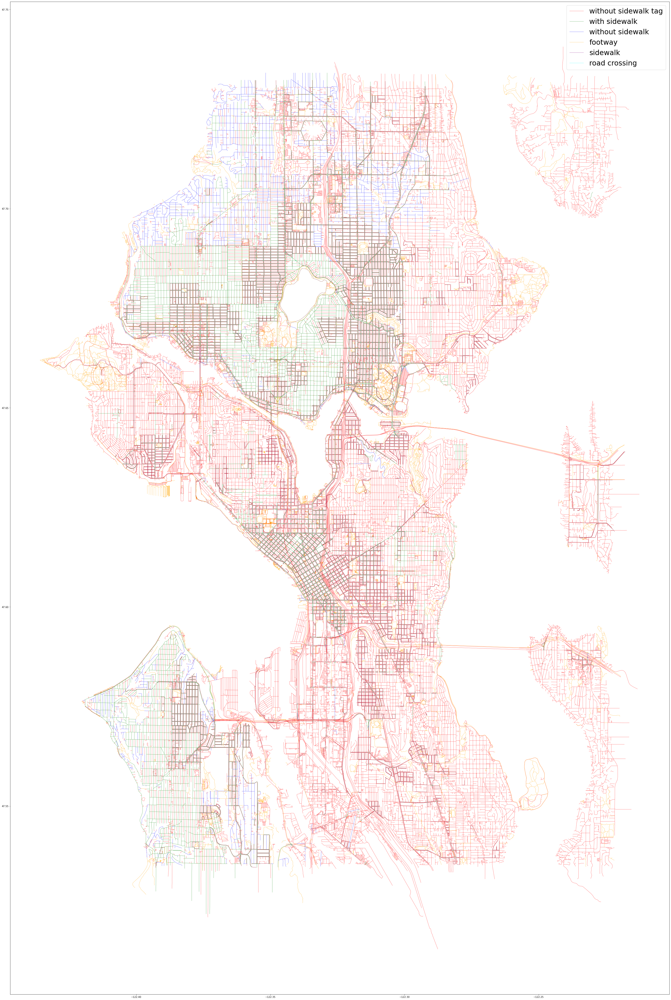

In [3]:
fig, ax = plt.subplots(figsize=(50,150)) 
wo_sidewalk_tag.plot(color = 'red', lw=0.50, ax=ax, label = 'without sidewalk tag')
w_sidewalk.plot(color = 'green', lw=0.50, ax=ax, label = 'with sidewalk')
wo_sidewalk.plot(color = 'blue', lw=0.50, ax=ax, label = 'without sidewalk')
footway.plot(color = 'orange', lw=0.50, ax=ax, label = 'footway')
sidewalk.plot(color = 'purple', lw=0.50, ax=ax, label = 'sidewalk')
crossing.plot(color = 'cyan', lw=0.50, ax=ax, label = 'road crossing')
plt.legend(prop = { 'size' : 30 })
plt.savefig('data/plots/sea_sidewalk.png', dpi=400)

### Explore sidewalk and sidewalk tags using folium map

In [5]:
sidewalk['ts'] = sidewalk['ts'].astype(str)
sidewalk.explore()

### Count **sources** of sidewalk

In [22]:
def count_source(cnt, tag):
    if('source' in tag):
        cnt[tag.get('source')] += 1

cnt = defaultdict(lambda: 0)
sidewalk.apply(lambda row: 
                count_source(
                    cnt,
                    row.tags
                ),
                axis = 1)

print('Source: ' 'Count\n')
for key in cnt: print("%s: %d"%(key, cnt[key]))

Source: Count

survey: 5
yahoo_wms: 1
yahoo_wms;knowledge: 6
knowledge: 5
Bing: 13
USGS Large Scale Imagery: 1
bing: 4
survey, imagery: 5
Local Knwoladge: 2
maxar: 67
knowledge;yahoo_wms: 2


### Plot sidewalk attribute tag percentage

Extract tag pert of attributes

In [2]:
def get_sidewalk_attribute_perct(city, res):
    l = LatestHandler()
    l.read_parsed_data(city)

    sidewalk = l.filter_data(sidewalk_qualifier)
    sidewalk = l.get_gdf(sidewalk)

    att = ['surface', 'smoothness', 'width', 'bicycle', 'incline', 'kerb', 'wheelchair', 'tactile_paving']
    mp = defaultdict(lambda: 0)

    for tag in sidewalk['tags'].tolist():
        for key in tag:
            if(key in att):
                mp[key] += 1

    for key in att:
        res.append([city, key, (mp[key]/len(sidewalk) * 100)])

cities = ['chi', 'sea', 'nyc', 'det', 'jvi']
res = []

for city in cities:
    get_sidewalk_attribute_perct(city, res)

city_res = pd.DataFrame(res, columns = ['city', 'attribute', 'percentage'])

plot

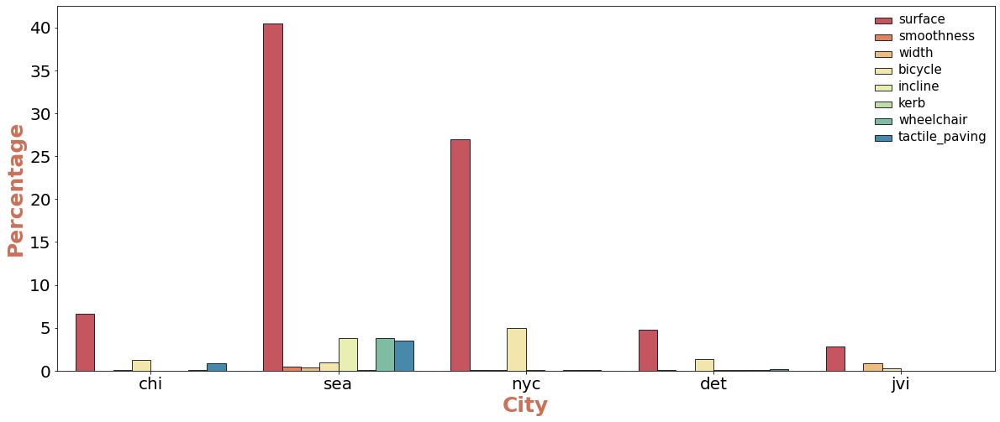

In [28]:
sns.color_palette("icefire", as_cmap=True)

plt.figure(figsize=(20, 8))
plt.xticks(fontsize='20')
plt.yticks(fontsize='20') 

ax = sns.barplot(x="city", y="percentage", hue="attribute", data=city_res, palette="Spectral", edgecolor = 'black')

plt.setp(ax.patches, linewidth=0.8)

leg = ax.legend()
leg.get_frame().set_linewidth(0.0)
plt.setp(ax.get_legend().get_texts(), fontsize='15')
plt.setp(ax.get_legend().get_title(), fontsize='15')

plt.xlabel('City', fontweight='bold', color = '#cd7058', fontsize='25')
plt.ylabel('Percentage', fontweight='bold', color = '#cd7058', fontsize='25');